# Automatic Lens Correction — AutoHDR Hackathon

**Approach**: CNN (ResNet50) → Predict Distortion Coefficients (k1, k2) → OpenCV Undistort

## Pipeline
1. Explore training data (distorted + corrected pairs)
2. Extract ground truth distortion coefficients from training pairs
3. Train ResNet50 regressor to predict k1, k2 from distorted images
4. Run inference on test images → undistort → save for submission

In [1]:
import os
import glob
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
from collections import defaultdict
import warnings
warnings.filterwarnings('ignore')

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.models as models

# scipy for optimization
from scipy.optimize import minimize

# skimage for SSIM
from skimage.metrics import structural_similarity as ssim

# Device setup — Apple Silicon MPS
if torch.backends.mps.is_available():
    device = torch.device('mps')
elif torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

print(f'Using device: {device}')
print(f'PyTorch version: {torch.__version__}')

# Project paths
PROJECT_DIR = '/Users/saiteja/Documents/Dev/AutoHDR'
TRAIN_DIR = os.path.join(PROJECT_DIR, 'lens-correction-train-cleaned')
OUTPUT_DIR = os.path.join(PROJECT_DIR, 'outputs', 'corrected')
WORKING_DIR = os.path.join(PROJECT_DIR, 'outputs')
os.makedirs(OUTPUT_DIR, exist_ok=True)
os.makedirs(WORKING_DIR, exist_ok=True)

Using device: mps
PyTorch version: 2.10.0


## 1. Data Exploration

In [3]:
# Data exploration
print(f'Training directory: {TRAIN_DIR}')
train_files = sorted(os.listdir(TRAIN_DIR))
num_originals = sum(1 for f in train_files if '_original.jpg' in f)
num_generated = sum(1 for f in train_files if '_generated.jpg' in f)
print(f'Total files: {len(train_files)}')
print(f'Original (distorted): {num_originals}')
print(f'Generated (corrected): {num_generated}')
print(f'Sample files: {train_files[:6]}')

Training directory: /Users/saiteja/Documents/Dev/AutoHDR/lens-correction-train-cleaned
Total files: 46238
Original (distorted): 23118
Generated (corrected): 23118
Sample files: ['0002be68-04ec-442b-9d26-418d9c229b33_g0_generated.jpg', '0002be68-04ec-442b-9d26-418d9c229b33_g0_original.jpg', '0002be68-04ec-442b-9d26-418d9c229b33_g13_generated.jpg', '0002be68-04ec-442b-9d26-418d9c229b33_g13_original.jpg', '0002be68-04ec-442b-9d26-418d9c229b33_g8_generated.jpg', '0002be68-04ec-442b-9d26-418d9c229b33_g8_original.jpg']


In [4]:
# Parse training pairs: group by (uuid, gN) → (original, generated)
train_files = sorted(os.listdir(TRAIN_DIR))
print(f'Total files in training dir: {len(train_files)}')
print(f'Sample files: {train_files[:6]}')

# Build pairs
pairs = defaultdict(dict)
for f in train_files:
    if not f.endswith('.jpg'):
        continue
    # Format: {uuid}_{gN}_{original|generated}.jpg
    parts = f.rsplit('_', 1)  # Split on last underscore
    if len(parts) == 2:
        image_id = parts[0]  # uuid_gN
        img_type = parts[1].replace('.jpg', '')  # original or generated
        pairs[image_id][img_type] = os.path.join(TRAIN_DIR, f)

# Filter to complete pairs only
complete_pairs = {k: v for k, v in pairs.items() if 'original' in v and 'generated' in v}
print(f'\nComplete training pairs: {len(complete_pairs)}')
print(f'Incomplete pairs: {len(pairs) - len(complete_pairs)}')

# Check unique properties (UUIDs)
uuids = set(k.rsplit('_', 1)[0] for k in complete_pairs.keys())
print(f'Unique properties: {len(uuids)}')

Total files in training dir: 46238
Sample files: ['0002be68-04ec-442b-9d26-418d9c229b33_g0_generated.jpg', '0002be68-04ec-442b-9d26-418d9c229b33_g0_original.jpg', '0002be68-04ec-442b-9d26-418d9c229b33_g13_generated.jpg', '0002be68-04ec-442b-9d26-418d9c229b33_g13_original.jpg', '0002be68-04ec-442b-9d26-418d9c229b33_g8_generated.jpg', '0002be68-04ec-442b-9d26-418d9c229b33_g8_original.jpg']

Complete training pairs: 23118
Incomplete pairs: 0
Unique properties: 5575


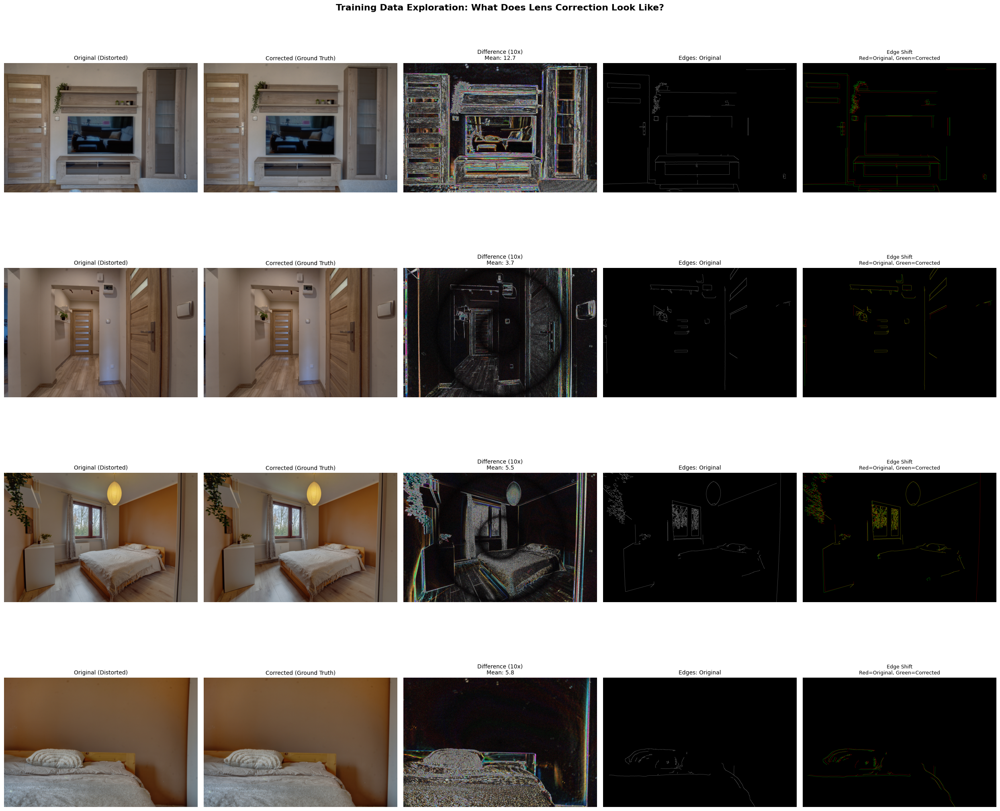

In [5]:
# Visualize training pairs: Original | Corrected | Difference | Edge Maps
sample_ids = list(complete_pairs.keys())[:4]

fig, axes = plt.subplots(4, 5, figsize=(25, 22))
fig.suptitle('Training Data Exploration: What Does Lens Correction Look Like?', fontsize=16, fontweight='bold')

for i, img_id in enumerate(sample_ids):
    orig = cv2.imread(complete_pairs[img_id]['original'])
    gen = cv2.imread(complete_pairs[img_id]['generated'])
    
    orig_rgb = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)
    gen_rgb = cv2.cvtColor(gen, cv2.COLOR_BGR2RGB)
    
    # Difference map
    diff = cv2.absdiff(orig, gen)
    diff_enhanced = (diff * 10).clip(0, 255).astype(np.uint8)
    
    # Edge detection on both
    orig_gray = cv2.cvtColor(orig, cv2.COLOR_BGR2GRAY)
    gen_gray = cv2.cvtColor(gen, cv2.COLOR_BGR2GRAY)
    edges_orig = cv2.Canny(cv2.GaussianBlur(orig_gray, (5,5), 1.5), 50, 150)
    edges_gen = cv2.Canny(cv2.GaussianBlur(gen_gray, (5,5), 1.5), 50, 150)
    
    # Edge difference (shows where lines shifted)
    edge_diff = np.zeros((*edges_orig.shape, 3), dtype=np.uint8)
    edge_diff[..., 0] = edges_orig  # Red = original edges
    edge_diff[..., 1] = edges_gen   # Green = corrected edges
    # Yellow where they overlap
    
    axes[i, 0].imshow(orig_rgb)
    axes[i, 0].set_title(f'Original (Distorted)', fontsize=10)
    
    axes[i, 1].imshow(gen_rgb)
    axes[i, 1].set_title('Corrected (Ground Truth)', fontsize=10)
    
    axes[i, 2].imshow(diff_enhanced)
    axes[i, 2].set_title(f'Difference (10x)\nMean: {diff.mean():.1f}', fontsize=10)
    
    axes[i, 3].imshow(edges_orig, cmap='gray')
    axes[i, 3].set_title('Edges: Original', fontsize=10)
    
    axes[i, 4].imshow(edge_diff)
    axes[i, 4].set_title('Edge Shift\nRed=Original, Green=Corrected', fontsize=9)

    short_id = img_id.split('-')[0] + '...' + img_id.split('_')[-1]
    axes[i, 0].set_ylabel(short_id, fontsize=9, rotation=0, labelpad=60)
    
    for j in range(5):
        axes[i, j].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(WORKING_DIR, 'eda_pairs.png'), dpi=100, bbox_inches='tight')
plt.show()

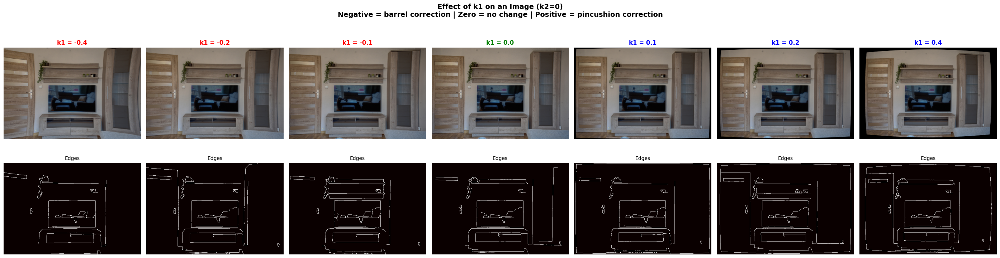

This shows WHY predicting k1 accurately is so important — even small changes affect geometry.


In [6]:
# What do different k1, k2 values do? Visual demo
demo_id = list(complete_pairs.keys())[0]
demo_img = cv2.imread(complete_pairs[demo_id]['original'])
demo_img = cv2.resize(demo_img, (512, 342))
h, w = demo_img.shape[:2]

fx = fy = w
cx, cy = w / 2.0, h / 2.0
cam_mtx = np.array([[fx, 0, cx], [0, fy, cy], [0, 0, 1]], dtype=np.float64)

k1_values = [-0.4, -0.2, -0.1, 0.0, 0.1, 0.2, 0.4]

fig, axes = plt.subplots(2, len(k1_values), figsize=(28, 8))
fig.suptitle('Effect of k1 on an Image (k2=0)\nNegative = barrel correction | Zero = no change | Positive = pincushion correction', 
             fontsize=14, fontweight='bold')

for i, k1 in enumerate(k1_values):
    dist = np.array([k1, 0, 0, 0, 0], dtype=np.float64)
    undist = cv2.undistort(demo_img, cam_mtx, dist)
    
    axes[0, i].imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    color = 'red' if k1 < 0 else ('green' if k1 == 0 else 'blue')
    axes[0, i].set_title(f'k1 = {k1}', fontsize=12, color=color, fontweight='bold')
    axes[0, i].axis('off')
    
    # Show edges to see line straightness
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(cv2.GaussianBlur(gray, (5,5), 1.5), 50, 150)
    axes[1, i].imshow(edges, cmap='hot')
    axes[1, i].set_title('Edges', fontsize=10)
    axes[1, i].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(WORKING_DIR, 'k1_effect_demo.png'), dpi=100, bbox_inches='tight')
plt.show()
print('This shows WHY predicting k1 accurately is so important — even small changes affect geometry.')

## 2. Extract Distortion Coefficients from Training Pairs

For each (original, generated) pair, we find the k1, k2 that best transforms original → generated.

We use optimization: try different k1, k2 values and pick the ones where `cv2.undistort(original, k1, k2)` is closest to the generated image.

In [7]:
def extract_distortion_params(original_path, generated_path, resize_dim=256):
    """
    Extract distortion coefficients (k1, k2) from a training pair.
    
    Strategy: Optimize k1, k2 so that cv2.undistort(original, k1, k2) 
    best matches the generated (corrected) image.
    
    We use SSIM as the similarity metric because it captures structural
    similarity (which is what lens correction is about).
    """
    # Load images
    orig = cv2.imread(original_path)
    gen = cv2.imread(generated_path)
    
    if orig is None or gen is None:
        return None, None, 0.0
    
    # Resize for speed (optimization runs many iterations)
    orig_small = cv2.resize(orig, (resize_dim, resize_dim))
    gen_small = cv2.resize(gen, (resize_dim, resize_dim))
    
    h, w = orig_small.shape[:2]
    
    # Camera matrix (assume centered principal point, focal length = image width)
    fx = fy = w
    cx, cy = w / 2.0, h / 2.0
    camera_matrix = np.array([[fx, 0, cx],
                               [0, fy, cy],
                               [0,  0,  1]], dtype=np.float64)
    
    gen_gray = cv2.cvtColor(gen_small, cv2.COLOR_BGR2GRAY)
    
    def objective(params):
        k1, k2 = params
        dist_coeffs = np.array([k1, k2, 0, 0, 0], dtype=np.float64)
        
        # Apply undistortion
        undistorted = cv2.undistort(orig_small, camera_matrix, dist_coeffs)
        undist_gray = cv2.cvtColor(undistorted, cv2.COLOR_BGR2GRAY)
        
        # Compute SSIM (we want to maximize it, so negate for minimization)
        score = ssim(gen_gray, undist_gray)
        return -score
    
    # Coarse grid search first to find good starting point
    best_score = -1
    best_k1, best_k2 = 0.0, 0.0
    
    for k1 in np.arange(-0.5, 0.51, 0.1):
        for k2 in np.arange(-0.3, 0.31, 0.1):
            score = -objective([k1, k2])
            if score > best_score:
                best_score = score
                best_k1, best_k2 = k1, k2
    
    # Fine optimization from best starting point
    result = minimize(objective, [best_k1, best_k2], 
                      method='Nelder-Mead',
                      options={'xatol': 1e-4, 'fatol': 1e-6, 'maxiter': 200})
    
    k1_opt, k2_opt = result.x
    final_ssim = -result.fun
    
    return k1_opt, k2_opt, final_ssim

In [8]:
# Test on a few pairs first
print('Testing parameter extraction on 5 sample pairs...\n')
sample_ids = list(complete_pairs.keys())[:5]

for img_id in sample_ids:
    k1, k2, score = extract_distortion_params(
        complete_pairs[img_id]['original'],
        complete_pairs[img_id]['generated']
    )
    print(f'{img_id}: k1={k1:.4f}, k2={k2:.4f}, SSIM={score:.4f}')

Testing parameter extraction on 5 sample pairs...

0002be68-04ec-442b-9d26-418d9c229b33_g0: k1=-0.3740, k2=1.0057, SSIM=0.7779
0002be68-04ec-442b-9d26-418d9c229b33_g13: k1=-0.0000, k2=-0.1466, SSIM=0.9327
0002be68-04ec-442b-9d26-418d9c229b33_g8: k1=-0.0000, k2=-0.1633, SSIM=0.9133
0002be68-04ec-442b-9d26-418d9c229b33_g9: k1=-0.3009, k2=0.7404, SSIM=0.8834
00480c6b-6232-4205-a25c-9dff34ac6337_g5: k1=-0.0000, k2=-0.1860, SSIM=0.8483


Computing optimization landscape (SSIM for every k1,k2 combination)...


100%|██████████| 30/30 [00:03<00:00,  9.49it/s]


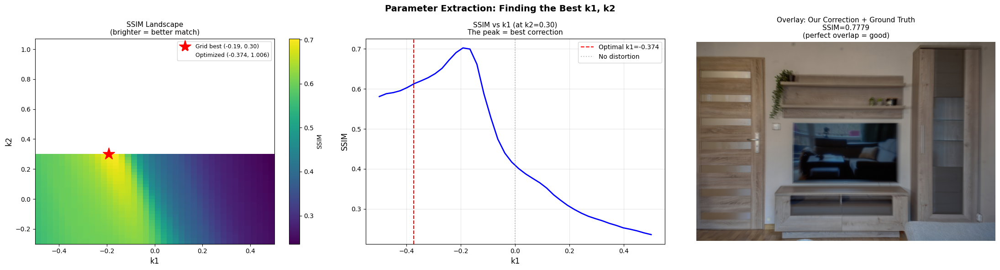


Optimal parameters: k1=-0.3740, k2=1.0057 (SSIM=0.7779)


In [9]:
# Visualize the OPTIMIZATION LANDSCAPE for one pair
# This shows how SSIM changes as we try different k1, k2 values
img_id = sample_ids[0]
orig = cv2.imread(complete_pairs[img_id]['original'])
gen = cv2.imread(complete_pairs[img_id]['generated'])

orig_small = cv2.resize(orig, (256, 256))
gen_small = cv2.resize(gen, (256, 256))
gen_gray = cv2.cvtColor(gen_small, cv2.COLOR_BGR2GRAY)

h, w = 256, 256
fx = fy = w
cx, cy = w / 2.0, h / 2.0
cam_mtx = np.array([[fx, 0, cx], [0, fy, cy], [0, 0, 1]], dtype=np.float64)

# Compute SSIM for a grid of k1, k2 values
k1_range = np.linspace(-0.5, 0.5, 40)
k2_range = np.linspace(-0.3, 0.3, 30)
ssim_grid = np.zeros((len(k2_range), len(k1_range)))

print('Computing optimization landscape (SSIM for every k1,k2 combination)...')
for i, k2 in enumerate(tqdm(k2_range)):
    for j, k1 in enumerate(k1_range):
        dist = np.array([k1, k2, 0, 0, 0], dtype=np.float64)
        undist = cv2.undistort(orig_small, cam_mtx, dist)
        undist_gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
        ssim_grid[i, j] = ssim(gen_gray, undist_gray)

# Find optimal
best_idx = np.unravel_index(ssim_grid.argmax(), ssim_grid.shape)
best_k2_grid = k2_range[best_idx[0]]
best_k1_grid = k1_range[best_idx[1]]

# Also get the optimized result
k1_opt, k2_opt, ssim_opt = extract_distortion_params(
    complete_pairs[img_id]['original'], complete_pairs[img_id]['generated']
)

fig, axes = plt.subplots(1, 3, figsize=(22, 6))
fig.suptitle('Parameter Extraction: Finding the Best k1, k2', fontsize=14, fontweight='bold')

# 1. Heatmap
im = axes[0].imshow(ssim_grid, extent=[k1_range[0], k1_range[-1], k2_range[0], k2_range[-1]], 
                     aspect='auto', origin='lower', cmap='viridis')
axes[0].plot(best_k1_grid, best_k2_grid, 'r*', markersize=20, label=f'Grid best ({best_k1_grid:.2f}, {best_k2_grid:.2f})')
axes[0].plot(k1_opt, k2_opt, 'wx', markersize=15, markeredgewidth=3, label=f'Optimized ({k1_opt:.3f}, {k2_opt:.3f})')
axes[0].set_xlabel('k1', fontsize=12)
axes[0].set_ylabel('k2', fontsize=12)
axes[0].set_title('SSIM Landscape\n(brighter = better match)', fontsize=11)
axes[0].legend(fontsize=9)
plt.colorbar(im, ax=axes[0], label='SSIM')

# 2. k1 slice (at best k2)
k2_idx = best_idx[0]
axes[1].plot(k1_range, ssim_grid[k2_idx, :], 'b-', linewidth=2)
axes[1].axvline(x=k1_opt, color='red', linestyle='--', label=f'Optimal k1={k1_opt:.3f}')
axes[1].axvline(x=0, color='gray', linestyle=':', alpha=0.5, label='No distortion')
axes[1].set_xlabel('k1', fontsize=12)
axes[1].set_ylabel('SSIM', fontsize=12)
axes[1].set_title(f'SSIM vs k1 (at k2={best_k2_grid:.2f})\nThe peak = best correction', fontsize=11)
axes[1].legend()
axes[1].grid(True, alpha=0.3)

# 3. Show the correction result
dist = np.array([k1_opt, k2_opt, 0, 0, 0], dtype=np.float64)
cam_full = np.array([[orig.shape[1], 0, orig.shape[1]/2], 
                      [0, orig.shape[1], orig.shape[0]/2], [0, 0, 1]], dtype=np.float64)
corrected = cv2.undistort(orig, cam_full, dist)
corrected_rgb = cv2.cvtColor(corrected, cv2.COLOR_BGR2RGB)
gen_rgb = cv2.cvtColor(gen, cv2.COLOR_BGR2RGB)

# Blend: corrected overlaid on ground truth
blend = cv2.addWeighted(corrected, 0.5, gen, 0.5, 0)
axes[2].imshow(cv2.cvtColor(blend, cv2.COLOR_BGR2RGB))
axes[2].set_title(f'Overlay: Our Correction + Ground Truth\nSSIM={ssim_opt:.4f}\n(perfect overlap = good)', fontsize=11)
axes[2].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(WORKING_DIR, 'optimization_landscape.png'), dpi=100, bbox_inches='tight')
plt.show()
print(f'\nOptimal parameters: k1={k1_opt:.4f}, k2={k2_opt:.4f} (SSIM={ssim_opt:.4f})')

In [11]:
# Extract parameters for ALL training pairs
# This takes a while (~1-2 hours for 23K pairs) — save results to CSV

PARAMS_CSV = os.path.join(WORKING_DIR, 'distortion_params.csv')

if os.path.exists(PARAMS_CSV):
    print(f'Loading cached parameters from {PARAMS_CSV}')
    params_df = pd.read_csv(PARAMS_CSV)
else:
    print(f'Extracting distortion parameters for {len(complete_pairs)} pairs...')
    results = []
    
    pair_ids = list(complete_pairs.keys())
    for i, img_id in enumerate(tqdm(pair_ids)):
        k1, k2, score = extract_distortion_params(
            complete_pairs[img_id]['original'],
            complete_pairs[img_id]['generated']
        )
        results.append({
            'image_id': img_id,
            'original_path': complete_pairs[img_id]['original'],
            'generated_path': complete_pairs[img_id]['generated'],
            'k1': k1,
            'k2': k2,
            'ssim_score': score
        })
        
        # Periodic save
        if (i + 1) % 500 == 0:
            pd.DataFrame(results).to_csv(PARAMS_CSV, index=False)
            print(f'  Saved {i+1}/{len(pair_ids)} results')
    
    params_df = pd.DataFrame(results)
    params_df.to_csv(PARAMS_CSV, index=False)
    print(f'Saved parameters to {PARAMS_CSV}')

# Show statistics
print(f'\nParameter statistics:')
print(params_df[['k1', 'k2', 'ssim_score']].describe())

Loading cached parameters from /Users/saiteja/Documents/Dev/AutoHDR/outputs/distortion_params.csv

Parameter statistics:
                 k1            k2    ssim_score
count  2.311800e+04  23118.000000  23118.000000
mean  -1.408727e-02     -0.136401      0.844471
std    1.205209e-01      0.412111      0.080721
min   -1.307681e+00     -5.819690      0.279011
25%   -1.217549e-16     -0.185273      0.804510
50%   -1.110223e-16     -0.123438      0.853021
75%   -1.014813e-16     -0.094895      0.896798
max    1.377802e+00      3.794492      1.000000


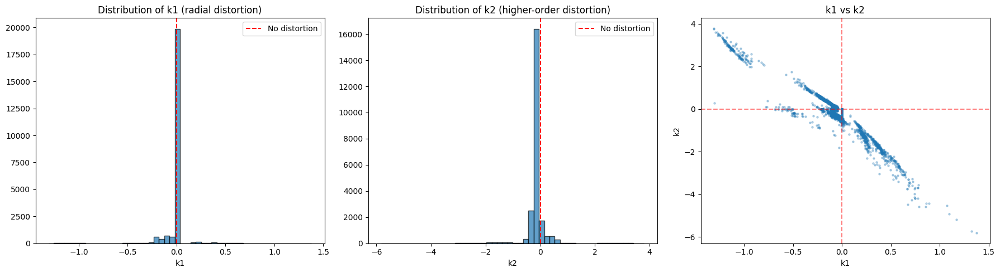


Images with near-zero distortion: 985 (4.3%)


In [12]:
# Visualize parameter distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].hist(params_df['k1'].dropna(), bins=50, edgecolor='black', alpha=0.7)
axes[0].set_xlabel('k1')
axes[0].set_title('Distribution of k1 (radial distortion)')
axes[0].axvline(x=0, color='red', linestyle='--', label='No distortion')
axes[0].legend()

axes[1].hist(params_df['k2'].dropna(), bins=50, edgecolor='black', alpha=0.7)
axes[1].set_xlabel('k2')
axes[1].set_title('Distribution of k2 (higher-order distortion)')
axes[1].axvline(x=0, color='red', linestyle='--', label='No distortion')
axes[1].legend()

axes[2].scatter(params_df['k1'].dropna(), params_df['k2'].dropna(), alpha=0.3, s=5)
axes[2].set_xlabel('k1')
axes[2].set_ylabel('k2')
axes[2].set_title('k1 vs k2')
axes[2].axhline(y=0, color='red', linestyle='--', alpha=0.5)
axes[2].axvline(x=0, color='red', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.savefig(os.path.join(WORKING_DIR, 'param_distribution.png'), dpi=100)
plt.show()

# How many have near-zero distortion?
near_zero = params_df[(params_df['k1'].abs() < 0.01) & (params_df['k2'].abs() < 0.01)]
print(f'\nImages with near-zero distortion: {len(near_zero)} ({100*len(near_zero)/len(params_df):.1f}%)')

In [13]:
# Filter out failed extractions and outliers
valid_params = params_df.dropna(subset=['k1', 'k2']).copy()
valid_params = valid_params[valid_params['ssim_score'] > 0.5]  # Only keep good fits
print(f'Valid training samples: {len(valid_params)} / {len(params_df)}')
print(f'Dropped {len(params_df) - len(valid_params)} poor fits')

Valid training samples: 23070 / 23118
Dropped 48 poor fits


## 3. Train ResNet50 Distortion Regressor

We train a CNN to predict [k1, k2] from a distorted image.

In [14]:
class DistortionDataset(Dataset):
    """Dataset that loads distorted images and their k1, k2 labels."""
    
    def __init__(self, dataframe, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform
    
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        
        # Load distorted image
        img = cv2.imread(row['original_path'])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = Image.fromarray(img)
        
        if self.transform:
            img = self.transform(img)
        
        # Labels: k1, k2
        label = torch.tensor([row['k1'], row['k2']], dtype=torch.float32)
        
        return img, label


# Transforms
train_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomHorizontalFlip(),  # Flips don't change radial distortion
    transforms.RandomVerticalFlip(),
    transforms.ColorJitter(brightness=0.1, contrast=0.1),  # Minor color aug
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

val_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

print('Dataset classes defined.')

Dataset classes defined.


In [15]:
# Train/validation split — split by UUID so same property isn't in both
valid_params['uuid'] = valid_params['image_id'].apply(lambda x: x.rsplit('_', 1)[0])
unique_uuids = valid_params['uuid'].unique()
np.random.seed(42)
np.random.shuffle(unique_uuids)

split_idx = int(len(unique_uuids) * 0.9)
train_uuids = set(unique_uuids[:split_idx])
val_uuids = set(unique_uuids[split_idx:])

train_df = valid_params[valid_params['uuid'].isin(train_uuids)].copy()
val_df = valid_params[valid_params['uuid'].isin(val_uuids)].copy()

print(f'Train samples: {len(train_df)}')
print(f'Val samples:   {len(val_df)}')
print(f'Train properties: {len(train_uuids)}')
print(f'Val properties:   {len(val_uuids)}')

# Create data loaders
BATCH_SIZE = 32

train_dataset = DistortionDataset(train_df, transform=train_transform)
val_dataset = DistortionDataset(val_df, transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=0, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False,
                        num_workers=0, pin_memory=True)

print(f'\nTrain batches: {len(train_loader)}')
print(f'Val batches:   {len(val_loader)}')

Train samples: 20713
Val samples:   2357
Train properties: 5012
Val properties:   557

Train batches: 648
Val batches:   74


In [16]:
class DistortionRegressor(nn.Module):
    """ResNet50 backbone with regression head for predicting k1, k2."""
    
    def __init__(self, num_params=2):
        super().__init__()
        # Load pre-trained ResNet50
        self.backbone = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        
        # Replace final FC layer with regression head
        in_features = self.backbone.fc.in_features  # 2048
        self.backbone.fc = nn.Sequential(
            nn.Linear(in_features, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(128, num_params)
        )
    
    def forward(self, x):
        return self.backbone(x)


model = DistortionRegressor(num_params=2).to(device)
print(f'Model parameters: {sum(p.numel() for p in model.parameters()):,}')
print(f'Trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}')

Model parameters: 24,623,042
Trainable parameters: 24,623,042


In [17]:
# Training functions with history tracking for visualization

def freeze_backbone(model):
    for name, param in model.backbone.named_parameters():
        if 'fc' not in name:
            param.requires_grad = False

def unfreeze_backbone(model):
    for param in model.parameters():
        param.requires_grad = True

# History tracker
history = {
    'train_loss': [], 'val_loss': [],
    'val_mae_k1': [], 'val_mae_k2': [],
    'learning_rate': [], 'epoch': [],
    'phase': []
}

def train_epoch(model, loader, criterion, optimizer):
    model.train()
    total_loss = 0
    batch_losses = []
    
    for images, labels in loader:
        images = images.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        predictions = model(images)
        loss = criterion(predictions, labels)
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
        batch_losses.append(loss.item())
    
    return total_loss / len(loader), batch_losses


def validate(model, loader, criterion):
    model.eval()
    total_loss = 0
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            predictions = model(images)
            loss = criterion(predictions, labels)
            total_loss += loss.item()
            all_preds.append(predictions.cpu())
            all_labels.append(labels.cpu())
    
    all_preds = torch.cat(all_preds)
    all_labels = torch.cat(all_labels)
    mae = torch.abs(all_preds - all_labels).mean(dim=0)
    
    return total_loss / len(loader), mae, all_preds, all_labels


def plot_training_progress(history, phase_name=''):
    """Live training dashboard — called after each epoch."""
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    fig.suptitle(f'Training Dashboard — {phase_name}', fontsize=14, fontweight='bold')
    
    epochs = history['epoch']
    
    # 1. Loss curves
    axes[0, 0].plot(epochs, history['train_loss'], 'b-o', markersize=3, label='Train Loss')
    axes[0, 0].plot(epochs, history['val_loss'], 'r-o', markersize=3, label='Val Loss')
    best_epoch = epochs[np.argmin(history['val_loss'])]
    best_loss = min(history['val_loss'])
    axes[0, 0].axvline(x=best_epoch, color='green', linestyle='--', alpha=0.5, label=f'Best (epoch {best_epoch})')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Loss (Huber)')
    axes[0, 0].set_title('Loss Curves')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)
    
    # 2. MAE k1 over epochs
    axes[0, 1].plot(epochs, history['val_mae_k1'], 'g-o', markersize=3, label='k1 MAE')
    axes[0, 1].plot(epochs, history['val_mae_k2'], 'm-o', markersize=3, label='k2 MAE')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('Mean Absolute Error')
    axes[0, 1].set_title('Prediction Accuracy (lower = better)')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)
    
    # 3. Learning rate schedule
    axes[1, 0].plot(epochs, history['learning_rate'], 'k-o', markersize=3)
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Learning Rate')
    axes[1, 0].set_title('Learning Rate Schedule')
    axes[1, 0].set_yscale('log')
    axes[1, 0].grid(True, alpha=0.3)
    
    # 4. Phase indicator + summary stats
    axes[1, 1].axis('off')
    summary = f"""
    Current Phase: {phase_name}
    
    Total Epochs: {len(epochs)}
    Best Val Loss: {best_loss:.6f} (epoch {best_epoch})
    Latest k1 MAE: {history['val_mae_k1'][-1]:.4f}
    Latest k2 MAE: {history['val_mae_k2'][-1]:.4f}
    Current LR: {history['learning_rate'][-1]:.2e}
    
    Target: k1 MAE < 0.02, k2 MAE < 0.01
    """
    axes[1, 1].text(0.1, 0.5, summary, fontsize=13, verticalalignment='center',
                     fontfamily='monospace', transform=axes[1, 1].transAxes,
                     bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8))
    
    plt.tight_layout()
    plt.savefig(os.path.join(WORKING_DIR, 'training_progress.png'), dpi=100, bbox_inches='tight')
    plt.show()


print('Training functions with visualization defined.')

Training functions with visualization defined.


PHASE 1: Training head only (backbone frozen)
WHY: The ResNet50 backbone already knows how to "see" edges,
shapes, and textures from ImageNet. We only train the new
regression head to map those features -> [k1, k2].
This is fast because we only update ~330K parameters.

Frozen parameters:     23,508,032  (backbone)
Trainable parameters:   1,115,010  (head only)
Epoch  1/20 | Train: 0.007378 | Val: 0.006820 | k1 MAE: 0.0380 | k2 MAE: 0.1452 | LR: 1.0e-03 ** BEST **
Epoch  2/20 | Train: 0.007229 | Val: 0.006688 | k1 MAE: 0.0353 | k2 MAE: 0.1429 | LR: 1.0e-03 ** BEST **
Epoch  3/20 | Train: 0.007190 | Val: 0.006736 | k1 MAE: 0.0410 | k2 MAE: 0.1435 | LR: 1.0e-03
Epoch  4/20 | Train: 0.007200 | Val: 0.006725 | k1 MAE: 0.0380 | k2 MAE: 0.1435 | LR: 1.0e-03
Epoch  5/20 | Train: 0.007184 | Val: 0.006646 | k1 MAE: 0.0366 | k2 MAE: 0.1417 | LR: 1.0e-03 ** BEST **
Epoch  6/20 | Train: 0.007175 | Val: 0.006753 | k1 MAE: 0.0399 | k2 MAE: 0.1441 | LR: 1.0e-03
Epoch  7/20 | Train: 0.007187 | Val: 0.

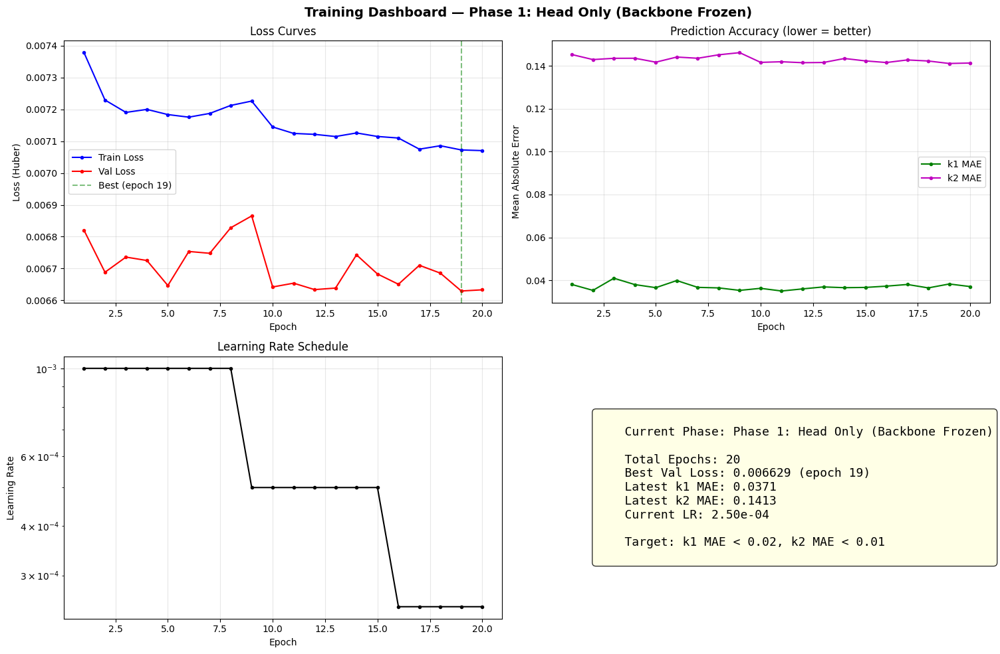


Phase 1 complete. Best val loss: 0.006629


In [18]:
# ========================
# PHASE 1: Train head only
# ========================
print('=' * 60)
print('PHASE 1: Training head only (backbone frozen)')
print('=' * 60)
print('WHY: The ResNet50 backbone already knows how to "see" edges,')
print('shapes, and textures from ImageNet. We only train the new')
print('regression head to map those features -> [k1, k2].')
print('This is fast because we only update ~330K parameters.\n')

freeze_backbone(model)
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
frozen = sum(p.numel() for p in model.parameters()) - trainable
print(f'Frozen parameters:   {frozen:>12,}  (backbone)')
print(f'Trainable parameters:{trainable:>12,}  (head only)')

criterion = nn.HuberLoss(delta=0.1)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), 
                       lr=1e-3, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, factor=0.5)

PHASE1_EPOCHS = 20
best_val_loss = float('inf')
model_phase1_path = os.path.join(WORKING_DIR, 'model_phase1.pth')
epoch_counter = 0

for epoch in range(PHASE1_EPOCHS):
    epoch_counter += 1
    train_loss, batch_losses = train_epoch(model, train_loader, criterion, optimizer)
    val_loss, val_mae, val_preds, val_labels = validate(model, val_loader, criterion)
    scheduler.step(val_loss)
    
    lr = optimizer.param_groups[0]['lr']
    
    # Track history
    history['epoch'].append(epoch_counter)
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['val_mae_k1'].append(val_mae[0].item())
    history['val_mae_k2'].append(val_mae[1].item())
    history['learning_rate'].append(lr)
    history['phase'].append('Phase 1: Head Only')
    
    improved = ''
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), model_phase1_path)
        improved = ' ** BEST **'
    
    print(f'Epoch {epoch+1:2d}/{PHASE1_EPOCHS} | '
          f'Train: {train_loss:.6f} | Val: {val_loss:.6f} | '
          f'k1 MAE: {val_mae[0]:.4f} | k2 MAE: {val_mae[1]:.4f} | '
          f'LR: {lr:.1e}{improved}')

# Show dashboard after Phase 1
plot_training_progress(history, 'Phase 1: Head Only (Backbone Frozen)')
print(f'\nPhase 1 complete. Best val loss: {best_val_loss:.6f}')

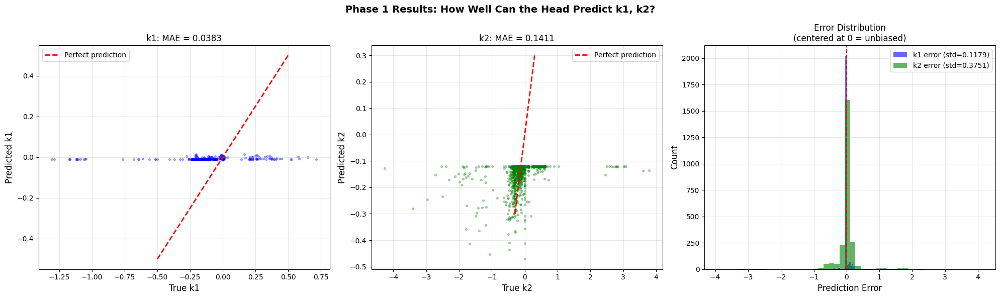

Phase 1 gives us a rough estimate. Phase 2 will fine-tune the backbone for much better accuracy.


In [19]:
# Quick visual check after Phase 1 — how are predictions looking so far?
model.load_state_dict(torch.load(model_phase1_path, weights_only=True))
_, _, preds_p1, labels_p1 = validate(model, val_loader, criterion)

fig, axes = plt.subplots(1, 3, figsize=(20, 6))
fig.suptitle('Phase 1 Results: How Well Can the Head Predict k1, k2?', fontsize=14, fontweight='bold')

axes[0].scatter(labels_p1[:, 0], preds_p1[:, 0], alpha=0.3, s=8, c='blue')
axes[0].plot([-0.5, 0.5], [-0.5, 0.5], 'r--', linewidth=2, label='Perfect prediction')
axes[0].set_xlabel('True k1', fontsize=12)
axes[0].set_ylabel('Predicted k1', fontsize=12)
axes[0].set_title(f'k1: MAE = {torch.abs(preds_p1[:,0]-labels_p1[:,0]).mean():.4f}')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].scatter(labels_p1[:, 1], preds_p1[:, 1], alpha=0.3, s=8, c='green')
axes[1].plot([-0.3, 0.3], [-0.3, 0.3], 'r--', linewidth=2, label='Perfect prediction')
axes[1].set_xlabel('True k2', fontsize=12)
axes[1].set_ylabel('Predicted k2', fontsize=12)
axes[1].set_title(f'k2: MAE = {torch.abs(preds_p1[:,1]-labels_p1[:,1]).mean():.4f}')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

# Error distribution
errors_k1 = (preds_p1[:, 0] - labels_p1[:, 0]).numpy()
errors_k2 = (preds_p1[:, 1] - labels_p1[:, 1]).numpy()
axes[2].hist(errors_k1, bins=50, alpha=0.6, label=f'k1 error (std={errors_k1.std():.4f})', color='blue')
axes[2].hist(errors_k2, bins=50, alpha=0.6, label=f'k2 error (std={errors_k2.std():.4f})', color='green')
axes[2].axvline(x=0, color='red', linestyle='--')
axes[2].set_xlabel('Prediction Error', fontsize=12)
axes[2].set_ylabel('Count', fontsize=12)
axes[2].set_title('Error Distribution\n(centered at 0 = unbiased)')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(WORKING_DIR, 'phase1_results.png'), dpi=100, bbox_inches='tight')
plt.show()
print('Phase 1 gives us a rough estimate. Phase 2 will fine-tune the backbone for much better accuracy.')

PHASE 2: Fine-tuning entire model (backbone unfrozen)
WHY: Now we unfreeze the backbone so the CNN can learn
distortion-specific features that ImageNet never taught it.
We use a lower learning rate so we don't destroy the
pre-trained weights — just nudge them.

Trainable parameters:   24,623,042  (ALL layers)
Epoch  1/30 | Train: 0.006969 | Val: 0.006392 | k1 MAE: 0.0385 | k2 MAE: 0.1358 | LR: 1.0e-04 ** BEST **
Epoch  2/30 | Train: 0.006824 | Val: 0.006375 | k1 MAE: 0.0404 | k2 MAE: 0.1362 | LR: 9.9e-05 ** BEST **
Epoch  3/30 | Train: 0.006823 | Val: 0.006394 | k1 MAE: 0.0387 | k2 MAE: 0.1367 | LR: 9.8e-05
Epoch  4/30 | Train: 0.006828 | Val: 0.006326 | k1 MAE: 0.0364 | k2 MAE: 0.1345 | LR: 9.6e-05 ** BEST **
Epoch  5/30 | Train: 0.006835 | Val: 0.006387 | k1 MAE: 0.0374 | k2 MAE: 0.1363 | LR: 9.3e-05
Epoch  6/30 | Train: 0.006845 | Val: 0.006522 | k1 MAE: 0.0366 | k2 MAE: 0.1395 | LR: 9.0e-05
Epoch  7/30 | Train: 0.006869 | Val: 0.006448 | k1 MAE: 0.0374 | k2 MAE: 0.1372 | LR: 8.7e-0

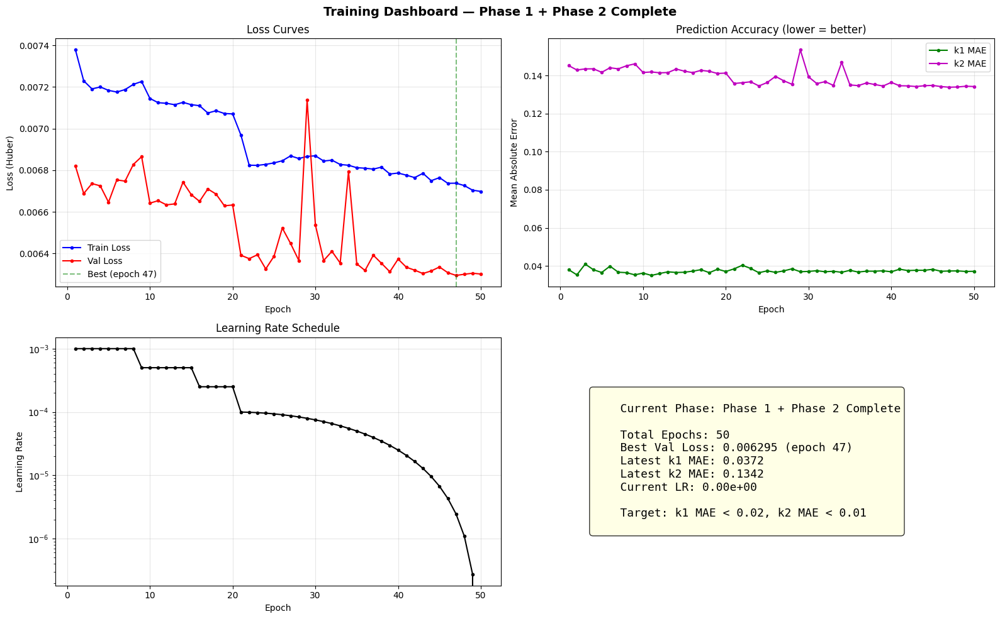


Phase 2 complete. Best val loss: 0.006295


In [20]:
# ============================
# PHASE 2: Fine-tune entire model
# ============================
print('=' * 60)
print('PHASE 2: Fine-tuning entire model (backbone unfrozen)')
print('=' * 60)
print('WHY: Now we unfreeze the backbone so the CNN can learn')
print('distortion-specific features that ImageNet never taught it.')
print('We use a lower learning rate so we don\'t destroy the')
print('pre-trained weights — just nudge them.\n')

model.load_state_dict(torch.load(model_phase1_path, weights_only=True))
unfreeze_backbone(model)
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'Trainable parameters: {trainable:>12,}  (ALL layers)')

optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=30)

PHASE2_EPOCHS = 30
best_val_loss = float('inf')
model_best_path = os.path.join(WORKING_DIR, 'model_best.pth')

for epoch in range(PHASE2_EPOCHS):
    epoch_counter += 1
    train_loss, batch_losses = train_epoch(model, train_loader, criterion, optimizer)
    val_loss, val_mae, val_preds, val_labels = validate(model, val_loader, criterion)
    scheduler.step()
    
    lr = optimizer.param_groups[0]['lr']
    
    # Track history
    history['epoch'].append(epoch_counter)
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['val_mae_k1'].append(val_mae[0].item())
    history['val_mae_k2'].append(val_mae[1].item())
    history['learning_rate'].append(lr)
    history['phase'].append('Phase 2: Full Fine-tune')
    
    improved = ''
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), model_best_path)
        improved = ' ** BEST **'
    
    print(f'Epoch {epoch+1:2d}/{PHASE2_EPOCHS} | '
          f'Train: {train_loss:.6f} | Val: {val_loss:.6f} | '
          f'k1 MAE: {val_mae[0]:.4f} | k2 MAE: {val_mae[1]:.4f} | '
          f'LR: {lr:.1e}{improved}')

# Show full training dashboard (both phases)
plot_training_progress(history, 'Phase 1 + Phase 2 Complete')
print(f'\nPhase 2 complete. Best val loss: {best_val_loss:.6f}')

Final Model Performance:
  k1 MAE: 0.0373
  k2 MAE: 0.1339


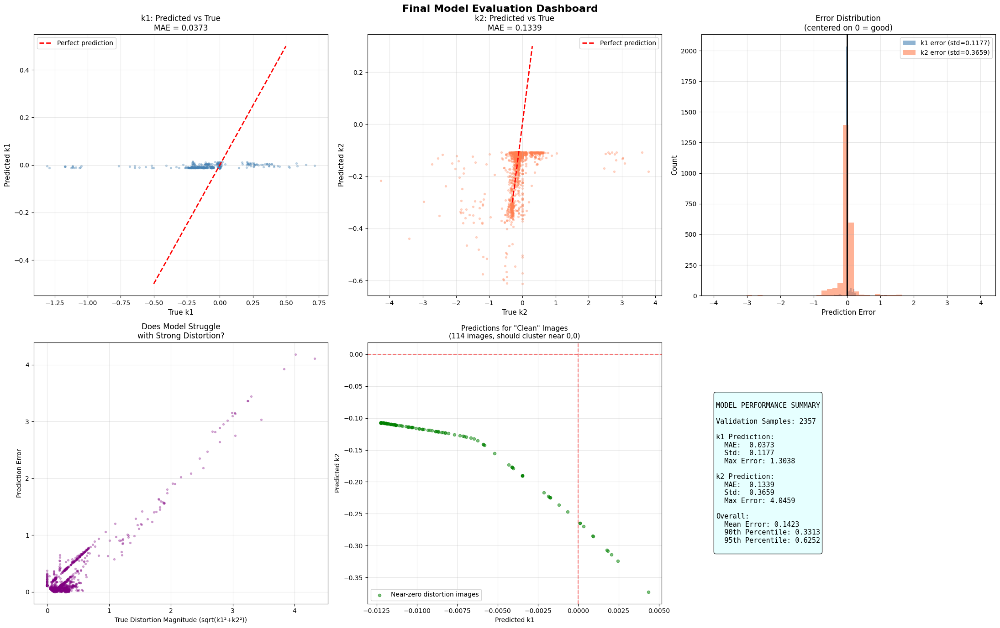

In [21]:
# ============================================
# FINAL MODEL EVALUATION — Comprehensive Dashboard
# ============================================
model.load_state_dict(torch.load(model_best_path, weights_only=True))
val_loss, val_mae, preds, labels = validate(model, val_loader, criterion)

print(f'Final Model Performance:')
print(f'  k1 MAE: {val_mae[0]:.4f}')
print(f'  k2 MAE: {val_mae[1]:.4f}')

fig, axes = plt.subplots(2, 3, figsize=(22, 14))
fig.suptitle('Final Model Evaluation Dashboard', fontsize=16, fontweight='bold')

# 1. k1 scatter: predicted vs true
axes[0, 0].scatter(labels[:, 0], preds[:, 0], alpha=0.3, s=8, c='steelblue')
axes[0, 0].plot([-0.5, 0.5], [-0.5, 0.5], 'r--', linewidth=2, label='Perfect prediction')
axes[0, 0].set_xlabel('True k1', fontsize=11)
axes[0, 0].set_ylabel('Predicted k1', fontsize=11)
axes[0, 0].set_title(f'k1: Predicted vs True\nMAE = {val_mae[0]:.4f}', fontsize=12)
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# 2. k2 scatter: predicted vs true
axes[0, 1].scatter(labels[:, 1], preds[:, 1], alpha=0.3, s=8, c='coral')
axes[0, 1].plot([-0.3, 0.3], [-0.3, 0.3], 'r--', linewidth=2, label='Perfect prediction')
axes[0, 1].set_xlabel('True k2', fontsize=11)
axes[0, 1].set_ylabel('Predicted k2', fontsize=11)
axes[0, 1].set_title(f'k2: Predicted vs True\nMAE = {val_mae[1]:.4f}', fontsize=12)
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# 3. Error distribution
errors_k1 = (preds[:, 0] - labels[:, 0]).numpy()
errors_k2 = (preds[:, 1] - labels[:, 1]).numpy()
axes[0, 2].hist(errors_k1, bins=50, alpha=0.6, color='steelblue', label=f'k1 error (std={errors_k1.std():.4f})')
axes[0, 2].hist(errors_k2, bins=50, alpha=0.6, color='coral', label=f'k2 error (std={errors_k2.std():.4f})')
axes[0, 2].axvline(x=0, color='black', linestyle='-', linewidth=2)
axes[0, 2].set_xlabel('Prediction Error', fontsize=11)
axes[0, 2].set_ylabel('Count', fontsize=11)
axes[0, 2].set_title('Error Distribution\n(centered on 0 = good)', fontsize=12)
axes[0, 2].legend()
axes[0, 2].grid(True, alpha=0.3)

# 4. Error vs distortion magnitude (does model struggle with large distortions?)
dist_magnitude = torch.sqrt(labels[:, 0]**2 + labels[:, 1]**2).numpy()
total_error = torch.sqrt((preds[:, 0]-labels[:, 0])**2 + (preds[:, 1]-labels[:, 1])**2).numpy()
axes[1, 0].scatter(dist_magnitude, total_error, alpha=0.3, s=8, c='purple')
axes[1, 0].set_xlabel('True Distortion Magnitude (sqrt(k1²+k2²))', fontsize=10)
axes[1, 0].set_ylabel('Prediction Error', fontsize=10)
axes[1, 0].set_title('Does Model Struggle\nwith Strong Distortion?', fontsize=12)
axes[1, 0].grid(True, alpha=0.3)

# 5. Predictions for "no distortion" images
near_zero_mask = dist_magnitude < 0.02
if near_zero_mask.sum() > 0:
    axes[1, 1].scatter(preds[near_zero_mask, 0].numpy(), preds[near_zero_mask, 1].numpy(), 
                        alpha=0.5, s=20, c='green', label='Near-zero distortion images')
    axes[1, 1].axhline(y=0, color='red', linestyle='--', alpha=0.5)
    axes[1, 1].axvline(x=0, color='red', linestyle='--', alpha=0.5)
    axes[1, 1].set_xlabel('Predicted k1')
    axes[1, 1].set_ylabel('Predicted k2')
    axes[1, 1].set_title(f'Predictions for "Clean" Images\n({near_zero_mask.sum()} images, should cluster near 0,0)', fontsize=11)
    axes[1, 1].legend()
    axes[1, 1].grid(True, alpha=0.3)
else:
    axes[1, 1].text(0.5, 0.5, 'No near-zero distortion\nimages in validation set',
                     ha='center', va='center', fontsize=12, transform=axes[1, 1].transAxes)
    axes[1, 1].set_title('Clean Image Predictions')

# 6. Summary stats box
axes[1, 2].axis('off')
summary_text = f"""
MODEL PERFORMANCE SUMMARY

Validation Samples: {len(preds)}

k1 Prediction:
  MAE:  {val_mae[0]:.4f}
  Std:  {errors_k1.std():.4f}
  Max Error: {np.abs(errors_k1).max():.4f}

k2 Prediction:
  MAE:  {val_mae[1]:.4f}
  Std:  {errors_k2.std():.4f}
  Max Error: {np.abs(errors_k2).max():.4f}

Overall:
  Mean Error: {total_error.mean():.4f}
  90th Percentile: {np.percentile(total_error, 90):.4f}
  95th Percentile: {np.percentile(total_error, 95):.4f}
"""
axes[1, 2].text(0.05, 0.5, summary_text, fontsize=11, verticalalignment='center',
                 fontfamily='monospace', transform=axes[1, 2].transAxes,
                 bbox=dict(boxstyle='round', facecolor='lightcyan', alpha=0.8))

plt.tight_layout()
plt.savefig(os.path.join(WORKING_DIR, 'evaluation_dashboard.png'), dpi=100, bbox_inches='tight')
plt.show()

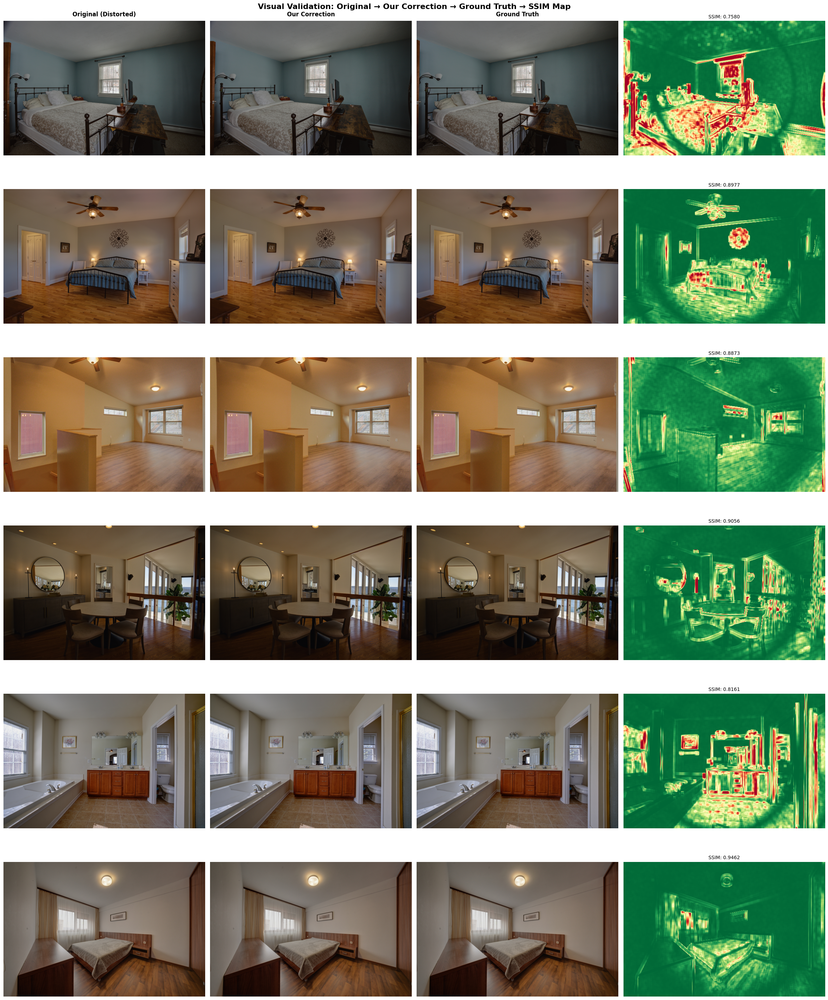

In [22]:
# ============================================
# VISUAL VALIDATION — Side-by-side correction results
# ============================================
model.eval()
n_show = 6
val_sample_indices = np.random.choice(len(val_df), n_show, replace=False)

fig, axes = plt.subplots(n_show, 4, figsize=(24, n_show * 5))
fig.suptitle('Visual Validation: Original → Our Correction → Ground Truth → SSIM Map', 
             fontsize=16, fontweight='bold')

col_titles = ['Original (Distorted)', 'Our Correction', 'Ground Truth', 'SSIM Difference Map']
for j, title in enumerate(col_titles):
    axes[0, j].set_title(title, fontsize=12, fontweight='bold', pad=10)

for i, idx in enumerate(val_sample_indices):
    row = val_df.iloc[idx]
    
    orig = cv2.imread(row['original_path'])
    gen = cv2.imread(row['generated_path'])
    h, w = orig.shape[:2]
    
    # Predict k1, k2
    img_tensor = val_transform(Image.fromarray(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)))
    img_tensor = img_tensor.unsqueeze(0).to(device)
    with torch.no_grad():
        pred = model(img_tensor).cpu().numpy()[0]
    pred_k1, pred_k2 = pred[0], pred[1]
    true_k1, true_k2 = row['k1'], row['k2']
    
    # Apply correction
    fx = fy = w
    cx, cy = w / 2.0, h / 2.0
    camera_matrix = np.array([[fx, 0, cx], [0, fy, cy], [0, 0, 1]], dtype=np.float64)
    dist_coeffs = np.array([pred_k1, pred_k2, 0, 0, 0], dtype=np.float64)
    corrected = cv2.undistort(orig, camera_matrix, dist_coeffs)
    
    # SSIM map between our correction and ground truth
    corr_gray = cv2.cvtColor(cv2.resize(corrected, (512, 342)), cv2.COLOR_BGR2GRAY)
    gen_gray = cv2.cvtColor(cv2.resize(gen, (512, 342)), cv2.COLOR_BGR2GRAY)
    ssim_score, ssim_map = ssim(corr_gray, gen_gray, full=True)
    
    # Plot
    axes[i, 0].imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB))
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(cv2.cvtColor(corrected, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_ylabel(f'k1: {pred_k1:.3f} (true: {true_k1:.3f})\n'
                           f'k2: {pred_k2:.3f} (true: {true_k2:.3f})', 
                           fontsize=9, rotation=0, labelpad=80)
    axes[i, 1].axis('off')
    
    axes[i, 2].imshow(cv2.cvtColor(gen, cv2.COLOR_BGR2RGB))
    axes[i, 2].axis('off')
    
    # SSIM map: red where different, green where similar
    ssim_colored = plt.cm.RdYlGn(ssim_map)  # Red=bad, Green=good
    axes[i, 3].imshow(ssim_colored)
    axes[i, 3].set_title(f'SSIM: {ssim_score:.4f}', fontsize=10)
    axes[i, 3].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(WORKING_DIR, 'visual_validation.png'), dpi=100, bbox_inches='tight')
plt.show()

## 4. Inference on Test Images

Apply our trained model to correct all test images.

In [23]:
# Test data directory
TEST_DIR = os.path.join(PROJECT_DIR, 'test-originals')
test_files = sorted([f for f in os.listdir(TEST_DIR) if f.endswith('.jpg')])
print(f'Test directory: {TEST_DIR}')
print(f'Test images: {len(test_files)}')
print(f'Sample: {test_files[:5]}')

Test directory: /Users/saiteja/Documents/Dev/AutoHDR/test-originals
Test images: 1000
Sample: ['008195cc-eadd-42bb-99b9-108deb738154_g0.jpg', '008195cc-eadd-42bb-99b9-108deb738154_g1.jpg', '008195cc-eadd-42bb-99b9-108deb738154_g10.jpg', '008195cc-eadd-42bb-99b9-108deb738154_g11.jpg', '008195cc-eadd-42bb-99b9-108deb738154_g13.jpg']


In [24]:
def correct_image(model, image_path, device, transform):
    """
    Correct a single distorted image using the trained model.
    
    1. Predict k1, k2 from the image
    2. Apply cv2.undistort() at full resolution
    3. Return the corrected image
    """
    # Load at full resolution
    img_full = cv2.imread(image_path)
    if img_full is None:
        print(f'Warning: Could not read {image_path}')
        return None
    
    h, w = img_full.shape[:2]
    
    # Predict k1, k2
    img_rgb = cv2.cvtColor(img_full, cv2.COLOR_BGR2RGB)
    img_pil = Image.fromarray(img_rgb)
    img_tensor = transform(img_pil).unsqueeze(0).to(device)
    
    model.eval()
    with torch.no_grad():
        pred = model(img_tensor).cpu().numpy()[0]
    
    k1, k2 = pred[0], pred[1]
    
    # Apply undistortion at full resolution
    fx = fy = float(w)
    cx, cy = w / 2.0, h / 2.0
    camera_matrix = np.array([[fx, 0, cx], [0, fy, cy], [0, 0, 1]], dtype=np.float64)
    dist_coeffs = np.array([k1, k2, 0, 0, 0], dtype=np.float64)
    
    # Get optimal camera matrix to minimize black borders
    new_camera_matrix, roi = cv2.getOptimalNewCameraMatrix(
        camera_matrix, dist_coeffs, (w, h), alpha=0, newImgSize=(w, h)
    )
    
    corrected = cv2.undistort(img_full, camera_matrix, dist_coeffs, None, new_camera_matrix)
    
    # Crop to ROI if available (removes black borders)
    if roi != (0, 0, 0, 0):
        x, y, rw, rh = roi
        corrected = corrected[y:y+rh, x:x+rw]
        # Resize back to original dimensions
        corrected = cv2.resize(corrected, (w, h), interpolation=cv2.INTER_LANCZOS4)
    
    return corrected, k1, k2


print('Correction function defined.')

Correction function defined.


In [25]:
# Run inference on test images
os.makedirs(OUTPUT_DIR, exist_ok=True)

model.load_state_dict(torch.load(model_best_path, weights_only=True))
model.eval()

if TEST_DIR and os.path.exists(TEST_DIR):
    test_files = sorted([f for f in os.listdir(TEST_DIR) if f.endswith(('.jpg', '.jpeg', '.png'))])
    print(f'Correcting {len(test_files)} test images...')
    
    results = []
    for f in tqdm(test_files):
        img_path = os.path.join(TEST_DIR, f)
        result = correct_image(model, img_path, device, val_transform)
        
        if result is not None:
            corrected, k1, k2 = result
            out_path = os.path.join(OUTPUT_DIR, f)
            cv2.imwrite(out_path, corrected, [cv2.IMWRITE_JPEG_QUALITY, 95])
            results.append({'filename': f, 'k1': k1, 'k2': k2})
    
    print(f'\nSaved {len(results)} corrected images to {OUTPUT_DIR}')
    pd.DataFrame(results).to_csv(os.path.join(WORKING_DIR, 'predictions.csv'), index=False)
else:
    print('Test directory not found. Running demo on validation images...')
    demo_indices = np.random.choice(len(val_df), min(5, len(val_df)), replace=False)
    for idx in demo_indices:
        row = val_df.iloc[idx]
        result = correct_image(model, row['original_path'], device, val_transform)
        if result is not None:
            corrected, k1, k2 = result
            fname = os.path.basename(row['original_path'])
            out_path = os.path.join(OUTPUT_DIR, fname)
            cv2.imwrite(out_path, corrected, [cv2.IMWRITE_JPEG_QUALITY, 95])
            print(f'  {fname}: k1={k1:.4f}, k2={k2:.4f}')

Correcting 1000 test images...


100%|██████████| 1000/1000 [00:51<00:00, 19.40it/s]



Saved 1000 corrected images to /Users/saiteja/Documents/Dev/AutoHDR/outputs/corrected


In [26]:
# Create zip file for scoring service upload
import zipfile

ZIP_PATH = os.path.join(WORKING_DIR, 'corrected_images.zip')
corrected_files = sorted(glob.glob(os.path.join(OUTPUT_DIR, '*.jpg')))

if corrected_files:
    with zipfile.ZipFile(ZIP_PATH, 'w', zipfile.ZIP_DEFLATED) as zf:
        for f in tqdm(corrected_files, desc='Zipping'):
            zf.write(f, os.path.basename(f))
    
    zip_size_mb = os.path.getsize(ZIP_PATH) / (1024*1024)
    print(f'\nCreated {ZIP_PATH} ({zip_size_mb:.1f} MB)')
    print(f'Contains {len(corrected_files)} images')
    print(f'\nNext steps:')
    print(f'1. Upload this zip to the scoring service')
    print(f'2. Download the submission.csv')
    print(f'3. Submit the CSV to Kaggle')
else:
    print('No corrected images found. Check that inference ran successfully.')

Zipping: 100%|██████████| 1005/1005 [00:09<00:00, 102.50it/s]


Created /Users/saiteja/Documents/Dev/AutoHDR/outputs/corrected_images.zip (565.9 MB)
Contains 1005 images

Next steps:
1. Upload this zip to the scoring service
2. Download the submission.csv
3. Submit the CSV to Kaggle


## 5. Self-Evaluation (Validation Set)

Compute our own metrics on the validation set to estimate competition score.

In [27]:
# Save the model for final submission
final_model_path = os.path.join(WORKING_DIR, 'final_model.pth')
torch.save({
    'model_state_dict': model.state_dict(),
    'architecture': 'ResNet50_DistortionRegressor',
    'num_params': 2,
    'input_size': 256,
    'normalization': {'mean': [0.485, 0.456, 0.406], 'std': [0.229, 0.224, 0.225]},
}, final_model_path)

print(f'Model saved to {final_model_path}')
print('\n--- DONE ---')
print('Next steps:')
print('1. Check the corrected images visually')
print('2. Upload corrected_images.zip to the scoring service')
print('3. Download submission.csv')
print('4. Submit CSV to Kaggle')

Model saved to /Users/saiteja/Documents/Dev/AutoHDR/outputs/final_model.pth

--- DONE ---
Next steps:
1. Check the corrected images visually
2. Upload corrected_images.zip to the scoring service
3. Download submission.csv
4. Submit CSV to Kaggle
